In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from math import ceil

In [3]:
# Load the data
datos = pd.read_csv("/home/thermostatic/Desktop/Uni code/Ratas/datos/Síndrome Vestibular/S2/S2s1DF100.csv", skiprows=12)

steps = 100
# Create a list of dataframes, each with 300 rows
datos_list = [datos.iloc[i:i+steps] for i in range(0, len(datos), steps)]
datos

,Sample no.,Time,X,Y,Aceleration,Distance,Consecuences,Unnamed: 7
0,0,0.000,79.923518,26.717557,0.000,0.000,0,2
1,1,0.638,78.776291,27.480916,0.000,1.803,0,2
2,2,0.812,75.908222,28.625954,0.104,4.039,0,2
3,3,0.996,71.510516,29.198473,0.220,5.799,0,2
4,4,1.164,67.877629,29.580153,0.345,4.776,0,2
...,...,...,...,...,...,...,...,...
7258,7258,1199.188,45.889101,13.358779,0.167,2.236,0,2
7259,7259,1199.354,45.124283,12.404580,0.135,1.601,0,2
7260,7260,1199.517,45.697897,12.022901,0.098,0.901,0,2
7261,7261,1199.683,46.080306,11.832061,0.054,0.559,0,2


In [4]:
def obtain_kinetic_data(datos):
    # Calculate time differences
    time_diff = np.diff(datos["Time"])
    # Calculate position differences
    displacement_x = np.diff(datos["X"])
    displacement_y = np.diff(datos["Y"])

    # Calculate velocity using finite difference method
    velocity_x = displacement_x / time_diff
    velocity_y = displacement_y / time_diff

    # Calculate acceleration using finite difference method
    acceleration_x = np.diff(velocity_x) / time_diff[:-1]
    acceleration_y = np.diff(velocity_y) / time_diff[:-1]
    
    return (time_diff, datos["X"], datos["Y"], displacement_x, displacement_y,
            velocity_x, velocity_y, acceleration_x, acceleration_y)

def obtain_speed(velocity_x, velocity_y):
    # Calculate speed
    speed = np.sqrt(velocity_x**2 + velocity_y**2)

    # Add a zero at the end to match the length of the position data
    speed = np.append(speed, 0)
    
    return speed

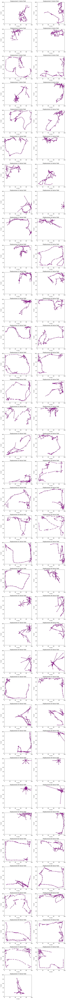

In [5]:
# Plot the vector field with position given by X and Y
plt.figure(figsize=(10, 4*ceil(len(datos_list)/2)))

for i in range(len(datos_list)):
    time_diff, position_x, position_y, displacement_x, displacement_y, velocity_x, velocity_y, acceleration_x, acceleration_y = obtain_kinetic_data(datos_list[i])
    plt.subplot(ceil(len(datos_list)/2), 2, i+1)
    plt.quiver(position_x[:-1], position_y[:-1], displacement_x, displacement_y, 
           color='purple')
    plt.xlabel('X (cm)')
    plt.ylabel('Y (cm)')
    plt.xlim(0, 100)
    plt.ylim(0, 100)
    plt.title(f'Displacement {i+1} Vector Field')
    
plt.tight_layout()

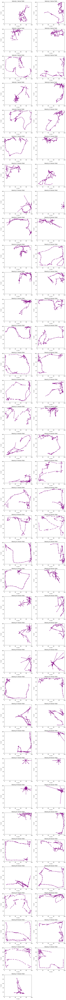

In [6]:
# Plot the vector field with position given by X and Y
plt.figure(figsize=(10, 4*ceil(len(datos_list)/2)))

for i in range(len(datos_list)):
    time_diff, position_x, position_y, displacement_x, displacement_y, velocity_x, velocity_y, acceleration_x, acceleration_y = obtain_kinetic_data(datos_list[i])
    plt.subplot(ceil(len(datos_list)/2), 2, i+1)
    plt.quiver(position_x[:-1], position_y[:-1], velocity_x, velocity_y, 
           color='purple')
    plt.xlabel('X (cm)')
    plt.ylabel('Y (cm)')
    plt.xlim(0, 100)
    plt.ylim(0, 100)
    plt.title(f'Velocity {i+1} Vector Field')
    
plt.tight_layout()

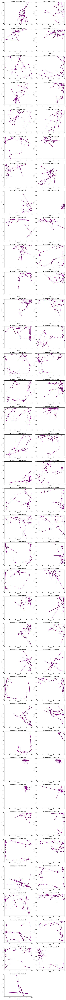

In [7]:
# Plot the vector field with position given by X and Y
plt.figure(figsize=(10, 4*ceil(len(datos_list)/2)))

for i in range(len(datos_list)):
    time_diff, position_x, position_y, displacement_x, displacement_y, velocity_x, velocity_y, acceleration_x, acceleration_y = obtain_kinetic_data(datos_list[i])
    plt.subplot(ceil(len(datos_list)/2), 2, i+1)
    plt.quiver(position_x[:-2], position_y[:-2], acceleration_x, acceleration_y, 
           color='purple')
    plt.xlabel('X (cm)')
    plt.ylabel('Y (cm)')
    plt.xlim(0, 100)
    plt.ylim(0, 100)
    plt.title(f'Acceleration {i+1} Vector Field')
    
plt.tight_layout()

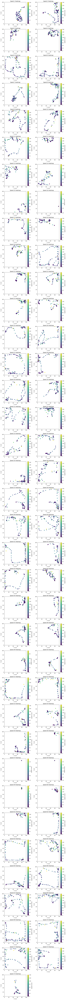

In [8]:
# Plot the vector field with position given by X and Y
plt.figure(figsize=(10, 4*ceil(len(datos_list)/2)))

for i in range(len(datos_list)):
    time_diff, position_x, position_y, displacement_x, displacement_y, velocity_x, velocity_y, acceleration_x, acceleration_y = obtain_kinetic_data(datos_list[i])
    plt.subplot(ceil(len(datos_list)/2), 2, i+1)
    
    speed = obtain_speed(velocity_x, velocity_y)
    plt.scatter(position_x, position_y, c=speed, cmap='viridis')
    plt.xlabel('X (cm)')
    plt.ylabel('Y (cm)')
    plt.xlim(0, 100)
    plt.ylim(0, 100)
    plt.title(f'Speed {i+1} Heatmap')
    plt.colorbar(label='Speed (cm/s)')
    
    
plt.tight_layout()

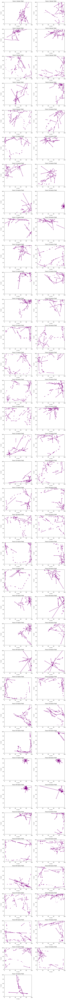

In [9]:
# Assume a mass of 0.25 kg for the rat
mass = 250

# Plot the vector field with position given by X and Y
plt.figure(figsize=(10, 4*ceil(len(datos_list)/2)))

works = []

for i in range(len(datos_list)):
    time_diff, position_x, position_y, displacement_x, displacement_y, velocity_x, velocity_y, acceleration_x, acceleration_y = obtain_kinetic_data(datos_list[i])
    plt.subplot(ceil(len(datos_list)/2), 2, i+1)
    # Calculate the force in the x and y directions
    force_x = mass * acceleration_x
    force_y = mass * acceleration_y
    
    # Calculate work done
    work_x = force_x * displacement_x[:-1]
    work_y = force_y * displacement_y[:-1]

    work_total = np.sum(work_x) + np.sum(work_y)
    
    works.append(work_total)
    
    plt.quiver(position_x[:-2], position_y[:-2], force_x, force_y, 
           color='purple')
    plt.xlabel('X (cm)')
    plt.ylabel('Y (cm)')
    plt.xlim(0, 100)
    plt.ylim(0, 100)
    plt.title(f'Force {i+1} Vector Field')
    
plt.tight_layout()

In [10]:
works

[-30711721.685919896,
 -64406992.902633235,
 -34065656.896058455,
 -82420749.481737,
 -118224388.6999289,
 -52881356.277118295,
 -35628786.6309117,
 -73269777.73466027,
 -93566056.4440844,
 -75461464.65929309,
 -72015722.25330034,
 -58526930.65020707,
 -65914704.471968755,
 -42482690.115205586,
 -29227582.195715155,
 -35081.44659794374,
 -49164067.418999195,
 -47854682.86942365,
 -104881255.97751115,
 -49136022.47567634,
 -68708226.85825351,
 -47166393.970547125,
 -79885479.24682912,
 -72938342.1593678,
 -46069646.439547874,
 -41048504.7012362,
 -86031655.07123405,
 -42476895.83870469,
 -80234432.59999526,
 -69461931.94504163,
 -107200975.98070523,
 -107108229.56137475,
 -51497624.10339247,
 -55918225.881547436,
 -38384625.020860136,
 -101493304.2210646,
 -54332164.896093875,
 -50158823.88050245,
 -115549069.29092743,
 -93191904.15004139,
 -48531921.46502539,
 -56664382.0318705,
 -56996017.594349,
 -48111591.18005645,
 -52856801.589944765,
 -29500269.96687309,
 -40933590.28716132,
 -50

In [13]:
f"{np.sum(works):,.0f}"

'-4,196,078,023'